# Bayessche Methode MCMC mit Python
Autor: Xian Yang, 05.09.2020

## Gliederung
0. Vorwort
1. Datensatzbereitstellung und -Reinigung
2. Klassische bayessche Analyse mit MCMC-Verfahren Schritt für Schritt
3. Schnellere Implementierung mit der Bibliothek `PyMC3`
4. ABC: Approximate Bayesian Computation - eine bessere? Lösung
5. Zusammenfassung

## 0. Vorwort



  
Dises Notebook bietet eine komplette Auseinandersetzung eines bayesschen Problems, wessen Fragestellung in der beiliegenden Notebook-Datei zu finden ist, und die Entwicklung verschiedener Lösungsalgorithmen dazu mit Python. Es wird hier nach möglichen Werten der Effizienz $\rho$ in einem Schweißprozess gesucht, welcher stochastisch gesehen ein Problem der Zufallsvariablenfolge darstellt. Ich gehe hier eine Vielfalt von Vorgehensmöglichkeiten durch, in dem ich den Schwerpunkt des Artikels lieber auf die rechnerische Umetzung der Algorithmen und deren statistischen Bedeutungen legen werde. Es wir also angenommen, dass dem Leser die Herleitung der mathematischen Formeln der bayesschen Analyse bekannt ist.    
  
Im ersten Paragraph lese ich den Datensatz ein und bereinige diesen. Es wird ein Ausreißer gefunden und entfernt und erklärt, warum er ein Ausreißer sein sollte. Im zweiten Paragraph wird die bayessche Methode Scritt für Schritt durchgeführt ohne Hilfe einer dafür bereitgestellten Python-Bibliothek. Im dritten Paragraph wird dieselbe Methode nochmal umgesetzt aber diesmal anhand der Bibliothek `PyMC3`. Im vierten Paragraph wird eine alternative Methode - die ABC - eingeführt und es wird diskutiert, warum der Autor die Methode simpler aber dennoch zuverlässiger findet, bevor zum Schluss im 5. Paragraph zusammengefasst wird. 

## 1. Datensatzbereitstellung und -Reinigung

Im nachfolgenden Text nenne ich die Zufallsvariablen in der Reihenfolge ihrer Erscheinungen jeweils `rho`($\rho$), `I_set`($I_{set}$), `I_pre`($I_{pre}$), `f_I_pre`($f(I_{pre})$) und `I`($I$), wobei `rho` die Gesuchte ist und `I_set` 4 Werte 4, 4,5, 5 und 5,6 annehmen kann. Der Leser fragt vielleicht, was ist mit der letzten Formel der ganzen Zufallsvariablenketten $P = RI^2$? $P$ ist hier zwar die letzte Variable von den Ganzen und zudem der beobachtete Output. Aber diese Formel ist rein deterministisch. Ich benutze hier daher lieber $I$ anstatt $P$ als Ausgangspunkt und wandle den Output dementsprechend um als erste Behandlung unserer Analyse. Wir werden später also sehen, diese Wahl hat ihren Vorteil wegen der normalen Verteilung der neuen Ausgangsdaten $I$.   


In [125]:
import pandas as pd

dataset = pd.read_csv("data.txt", header = None, sep = " ")
dataset.head(3)

,0,1
0,4.5,498.123567
1,5.0,417.455043
2,4.0,44.337264


In [126]:
import numpy as np

I_set_obs = dataset.iloc[:, 0].to_numpy()
I_obs = np.sqrt(dataset.iloc[:, 1].to_numpy()) / 2 # P wird umgewandelt zu I und ich benutze ab jetzt ausschließlich I als Output

I_obs_4 = I_obs[I_set_obs == 4]
I_obs_4_5 = I_obs[I_set_obs == 4.5]
I_obs_5 = I_obs[I_set_obs == 5]
I_obs_5_6 = I_obs[I_set_obs == 5.6]

Wir mögen zuerst unsere neuen Ausgangsdaten $I$ kurz kennen lernen.

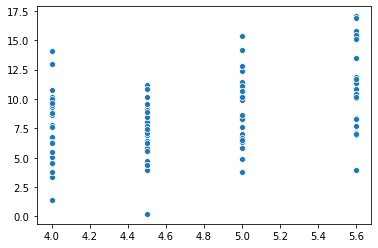

In [127]:
import seaborn as sns

sns.scatterplot(I_set_obs, I_obs)

Wir können 2 Schulussfolgerungen darausziehen  
  1. Der Output zu jedem Inputwert `I_set` scheinen jeweils normal verteilt zu sein. (Warum man lieber $I$ statt $P$ benutzen sollte.)   
  2. Der Punkt in der zweiten Spalte von ganz unten scheint ein Ausreißer zu sein. Erstens weil er zu weit von den Restlichen liegt, zweitens scheint ein Fast-Nullwert eher ein Defektversuch zu sein. Eine Prüfung der Normalverteilung der Outputs kann diese Vermutung besser bestätigen.

In [128]:
from scipy.stats import shapiro, normaltest
from varname import nameof
for i, obs_data in enumerate([I_obs_4, I_obs_4_5, I_obs_5, I_obs_5_6]):
    stat, p = shapiro(obs_data)
    stat2, p2 = normaltest(obs_data)
    print("Column {0}. Number of obs.: {1}. Shapiro: {2:.2f}, D'Agostino: {3:.2f}".format(i+1, len(obs_data), p, p2))

Column 1. Number of obs.: 25. Shapiro: 0.99, D'Agostino: 0.95
Column 2. Number of obs.: 25. Shapiro: 0.50, D'Agostino: 0.14
Column 3. Number of obs.: 25. Shapiro: 0.98, D'Agostino: 0.90
Column 4. Number of obs.: 25. Shapiro: 0.21, D'Agostino: 0.54


Natürlich sind die Beobachtungen von $I$, der komplexen Herleitung der Zufallsvariablenkette zufolge, für jeden Input $I_{set}$ nicht stochastisch strikt normal verteilt. Die Normalverteilungen scheinen hier jedoch in den Ergebnissen gut zu stimmen (ich habe Simulationen von Stichproben mit 1000 Individuen zu mehreren $I_{set}$ gemacht und selbst dann schneidet der Normalitätstest immer noch positiv ab!). Außer dass 25 Beobachtungen nur eine kleine Menge sind, liegt die Normalität vermutlich daran dass das erste Rauschen $\mathcal{N}(0, 1)$ in $I_{pre} = \rho I_{set} + \mathcal{N}(0, 1)$ später durch die Exponentialrechnung und den Kehrwert einen sehr geringen Einfluss auf das etwa größere Rauschen $\mathcal{N}(0, 3)$ in der letzten Formel hat. Ferner lässt sich zudem noch bestätigen, dass die empirischen Standardabweichungen der Ergebnissen sogar kleiner sind als die des Rauschens, nämlich 3: 

In [129]:
for i, obs_data in enumerate([I_obs_4, I_obs_4_5, I_obs_5, I_obs_5_6]):
    print("Column {0}. Mean: {1:.2f}, standard deviation: {2:.2f}".format(i+1, obs_data.mean(), obs_data.std()))

Column 1. Mean: 7.59, standard deviation: 2.93
Column 2. Mean: 7.08, standard deviation: 2.40
Column 3. Mean: 9.22, standard deviation: 2.79
Column 4. Mean: 10.87, standard deviation: 3.51


Wir wissen ja aber, das Rauschen $\mathcal{N}(0, 3)$ ist unabhängig vom restlichen Teil und das Resultat kann somit auf keinem Fall eine noch kleinere Standardabweichung haben als dieses Rauschen selbst. Wir können schlussendlich davon ausgehen, _dass die Ungenauigkeit der Endergebnisse zum großen Teil von diesem Rauschen kommt und nicht von den anderen Termen der Formel._ $\rho$ hat also nur einen Einfluss auf den Durchschnittwert der Endergebnisse und nicht auf ihre Verteilung, auch nicht auf ihre Ungenauigkeit.  
  
Nun können wir ziemlich sicher sein, dass der außergewöhnlich niedrige Beobachtungswert bei $I_{set} = 4,5$ mit hoher Wahrscheinlichkeit ein Ausreißer ist. (Endlich sollte man sich dieselbe Frage auch für $I_{set} = 5,6$ gemäß dessen Normaltestergebnisses stellen aber da kann man keine klaren Ausreißer bestimmen. In der Praxis kann und sollte man diese immer lieber mit dem Kunden besprechen. Hier lassen wir die Frage offen da sie nicht zum Thema des Artikels gehört.)  
  
Schlussendlich entfernen wir den bestimmten Ausreißer.

In [130]:
dataset = dataset.loc[dataset.iloc[:, 1] >= 4 * 0.5 * 0.5, :]

I_set_obs = dataset.iloc[:, 0].to_numpy()
I_obs = np.sqrt(dataset.iloc[:, 1].to_numpy()) / 2 

I_obs_4 = I_obs[I_set_obs == 4]
I_obs_4_5 = I_obs[I_set_obs == 4.5]
I_obs_5 = I_obs[I_set_obs == 5]
I_obs_5_6 = I_obs[I_set_obs == 5.6]

stat, p = shapiro(I_obs_4_5)
stat2, p2 = normaltest(I_obs_4_5)

print("I = 4,5. Length: {0}. Shapiro: {1:.2f}, D'Agostino: {2:.2f}. Mean: {3:.2f}, standard deviation: {4:.2f}".format(len(I_obs_4_5), p, p2, I_obs_4_5.mean(), I_obs_4_5.std()))

I = 4,5. Length: 24. Shapiro: 0.77, D'Agostino: 0.71. Mean: 7.37, standard deviation: 1.99


## 2. Klassische bayessche Analyse mit MCMC-Verfahren Schritt für Schritt

Die bayessche Methode mit MCMC besteht im simpelsten Fall von einer Dimension grob gesagt darin:  

1. Eine Prior vom gesuchten Parameter $\rho$ festlegen (ob diese nachher stimmt ist in der Praxis meistens nicht ganz wichtig)  
2. Einen Zufallswert vom gesuchten Parameter $\rho$ nach der Prior erzeugen, nennen wir $\rho_0$
3. Man simuliere ein Folge von Beobachtungen durch $\rho_0$, nennen wir $simobs_0$
3. Man behalte $\rho_0$, schreibe ihn in eine $\rho$-Stichprobe ein und berechne $Prior(\rho_0)*P(obs|\rho_0)$ mithilfe der empirischen Verteilung von $simobs_0$
4. Man erzeuge nach einer bestimmten Regel einen neuen Zustandsvorschlag $\rho_1$, simuliere damit eine neue Folge von Beobachtungen $simobs_1$ und berechne dann $Prior(\rho_1)*P(obs|\rho_1)$ mithilfe der empirischen Verteilung von $simobs_1$
5. Wesentlicher Schritt - MCMC: Man behalte mit einer Wahrscheinlichkeit von $\min(1, Prior(\rho_1)*P(obs|\rho_1) / Prior(\rho_0)*P(obs|\rho_0))$ den neuen Zustand $\rho_1$ in der $\rho$-Stichprobe und ersetze $\rho_0 := \rho_1$ (der Übergang). 
6. Man wiederhole alles ab dem Schritt 4, bis eine bestimmte Voraussetzung erreicht wird.
7. Schlussendlich wird die behaltene Stichprobe der $\rho$-Werte die Posterior-Verteilung von $\rho$ empirisch bestimmen können. 

Wie wird endlich im Schritt 4 ein neuer $\rho$-Wert generiert? Nach Metropolis erzeugt man diesen einfach mit der Prior von $\rho$. Nach Hastings kann man eine symetrische kleine Verteilung auf Basis von $\rho_0$ verwenden, so dass die Probennahmen von $\rho$ nicht mehr derart zufällig sind wie bei Metropolis und der $\rho$-Wert schneller zur richtigen Posterior konvergiert. Das letztere hat natürlich einen Nachteil, nämlich die generierten $\rho$-Werte können einfacher eine systematische Abweichung enthalten. Die zwei Methoden unterscheiden sich in der Praxis nicht unbedingt weit von einander im Endeffekt. Daher verwende ich hier Hastings. Für die kleine Verteilung, um $\rho_1$ durch $\rho_0$ zu erzeugen, benutze ich die Normalverteilung die auf $\rho_0$ zentriert ist.   
  
Vorletzte Frage die noch offen steht: die Prior. Ich nehme hier ohne weiteres Vorwissen einfach an, dass die Effizienz $\rho$ die stetige Gleichverteilung $[0, 1]$ hat. (Eigentlich kann sie nicht nahe 1 sein sonst wäre der Kunde nicht zu uns gekommen. Nahe 0 kann sie auch nicht sein sonst wäre das System schon längst außer Betrieb. Aber gut. So tief gehen wir hier nicht in die Details.) So kann man die Berechung der Prior von $\rho$ auch weglassen, weil sie überall gleich ist. 

Nun die allerletzte Frage: wie kalkuliere ich die empirische Verteilung von $simobs_0$ bzw. $simobs_1$ in den Schritten 3 und 4? Wir benutzen hier die Techniken der Kerndichteschätzung und nehme dazu die Funktion _KernelDensity()_ aus der Bibliothek `KernelDensity` von `Scikit-learn`. Wie wird die Fenstergröße (bandwidth) dabei ausgewählt? Man könnte hier z. B. `GridSearchCV` benutzen um die beste Fenstergröße herauszutunen. Aber wenn man sie in jeder Schleife tunen würde, würde die Laufzeit (zumindest auf meinem Rechner) unerträglich lang werden. Daher hat der Autor ein paar (mehrere Hunderte) Datensätze zufällig erzeugt und für jeden davon nach der besten Fenstergröße gesucht. Diese landet glücklicherweise meistens bei 0.774. Ich lasse dem Leser die Details falls er Interesse hat. Hier kann man glauben, der Wert 0.774 wurde nicht willkürlich ausgewählt, sondern herausgetunet.   
  
Los geht's.

In [94]:
from sklearn.neighbors import KernelDensity
# from sklearn.model_selection import GridSearchCV

# Ich bräuchte eine Funktion die mir eine große Menge Beobachtungen zurückliefert, gegeben seien ein bestimmtes legitimes rho und eines der 4 i_set, um später ihre empirische Verteilung berechnen zu können. 
def gen_data_fixed_mu(rho, i_set, size = 1000):
    i_pre = rho * i_set + np.random.normal(loc = 0, scale = 1, size = (size, ))
    f_i_pre = 5 + 10 / (1 + np.exp(- i_pre + 4))
    i = f_i_pre + np.random.normal(loc = 0, scale = 3, size = (size, ))
    return i

# Ich bräuchte als Nächstes eine Funktion, die mir die bedingte logarithmische Dichte für jede echte Beobachtung additiert zurückliefert, gegeben sei rho.  
def calculate_log_density(rho):
    log_density = 0
    for i_set, i_obs_compenent in [(4, I_obs_4), (4.5, I_obs_4_5), (5, I_obs_5), (5.6, I_obs_5_6)]:
        simulated_data = gen_data_fixed_mu(rho_new, i_set)
        kde = KernelDensity(kernel = 'gaussian', bandwidth = 0.774).fit(simulated_data.reshape(-1, 1))
        log_den_component = kde.score_samples(i_obs_compenent.reshape(-1, 1)).sum()
        log_density += log_den_component
    return log_density

# Ich initialisiere
rho_current = 0.5
total_steps = 10000
rho_list = list()
log_den_current = 0

# MCMC
print("Processing MCMC, please wait.")
for step in range(total_steps):
    if step == 0:
        print("0% finished")
        log_den_current = calculate_log_density(rho_current)
    else:
        if step % (total_steps / 10) == 0:
            print("{0:.0%} finished".format(step / total_steps))
        elif step == total_steps - 1:
            print("Finished.")

        # Ich adaptiere hier eine Strategie so dass die Scrittweite der Suche nach dem neuen rho-Wert allmählich verkleinert wird. 
        # Das dient dazu, dass die rho-Vorschläge nicht zu früh um einen Ort stehen bleiben, aber auch nicht immer hin und herspringen.
        rho_new = rho_current + np.random.normal(scale = 0.1 if step <= 2*total_steps/10 else 0.05 if step <= 4*total_steps/10 else 0.02 if step <= 6*total_steps/10 else 0.01)
        if rho_new >= 1 or rho_new <= 0:
            continue
        log_den_new = calculate_log_density(rho_new)
        p_accept = np.exp(log_den_new - log_den_current) # Der sogenannte Übergangswert. Wenn er größer 1 ist, gehe ich mit Sicherheit zum nächsten Zustand.
        if np.random.uniform() < p_accept:
            if step >= total_steps / 2: # Ich lösche die erste Hälfte der Ergebnisse, egal wie sie aussieht. Das ist die sogenannte Burn-In Periode (dazu sollte man eigentlich die Konvergenz überprüfen aber gut...)  
                rho_list.append(rho_new)
            rho_current = rho_new
            log_den_current = log_den_new


Processing MCMC, please wait.
0% finished
10% finished
20% finished
30% finished
40% finished
50% finished
60% finished
70% finished
80% finished
90% finished
Finished.


Left sample length: 2926, mean: 0.69, standard deviation: 0.04


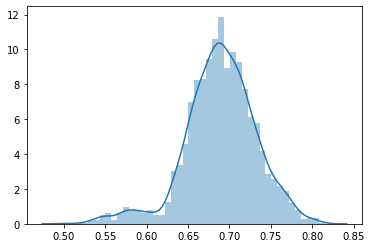

In [100]:
print("Left sample length: {0:d}, mean: {1:.2f}, standard deviation: {2:.2f}".format(len(rho_list), np.array(rho_list).mean(), np.array(rho_list).std()))
sns.distplot(rho_list)

## 3. Schnellere Implementierung mit der Bibliothek `PyMC3`
Ich benutze jetzt die Bibliothek `PyMC3`, die der bayesschen Analyse mit MCMC-Methoden gewidmet ist. Hier ist nicht viel zu erklären, das Modell spricht gut für sich aus.

In [106]:
import pymc3 as pm

with pm.Model() as amplifier_model:
    roh = pm.Uniform("roh", 0.0, 1.0)

    I_pre_0 = pm.Normal("I_pre_0", mu = roh * 4, sigma = 1)
    f_I_pre_0 = 5 + 10 / (1 + np.exp(- I_pre_0 + 4)) 
    I_0 = pm.Normal("I_0", mu = f_I_pre_0, sigma = 3, observed = I_obs_4) 
    
    I_pre_1 = pm.Normal("I_pre_1", mu = roh * 4.5, sigma = 1)
    f_I_pre_1 = 5 + 10 / (1 + np.exp(- I_pre_1 + 4)) 
    I_1 = pm.Normal("I_1", mu = f_I_pre_1, sigma = 3, observed = I_obs_4_5) 
    
    I_pre_2 = pm.Normal("I_pre_2", mu = roh * 5, sigma = 1)
    f_I_pre_2 = 5 + 10 / (1 + np.exp(- I_pre_2 + 4)) 
    I_2 = pm.Normal("I_2", mu = f_I_pre_2, sigma = 3, observed = I_obs_5) 
    
    I_pre_3 = pm.Normal("I_pre_3", mu = roh * 5.6, sigma = 1)
    f_I_pre_3 = 5 + 10 / (1 + np.exp(- I_pre_3 + 4)) 
    I_3 = pm.Normal("I_3", mu = f_I_pre_3, sigma = 3, observed = I_obs_5_6) 
    
    trace = pm.sample(20000, cores = 8)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [I_pre_3, I_pre_2, I_pre_1, I_pre_0, roh]
Sampling 8 chains, 0 divergences: 100%|██████████| 164000/164000 [02:07<00:00, 1282.16draws/s]


mean    sd  hpd_3%  hpd_97%  ...     ess_sd   ess_bulk   ess_tail  r_hat
I_pre_0  2.87  0.33    2.25     3.48  ...  118457.86  135483.06   89094.82    1.0
I_pre_1  2.79  0.35    2.13     3.42  ...  137919.53  155808.49   96201.85    1.0
I_pre_2  3.67  0.25    3.19     4.13  ...  163334.45  164841.92  119350.03    1.0
I_pre_3  4.35  0.25    3.88     4.82  ...  147549.71  150792.16  115758.52    1.0
roh      0.72  0.11    0.52     0.92  ...  110605.71  116617.74   65744.40    1.0

[5 rows x 11 columns]


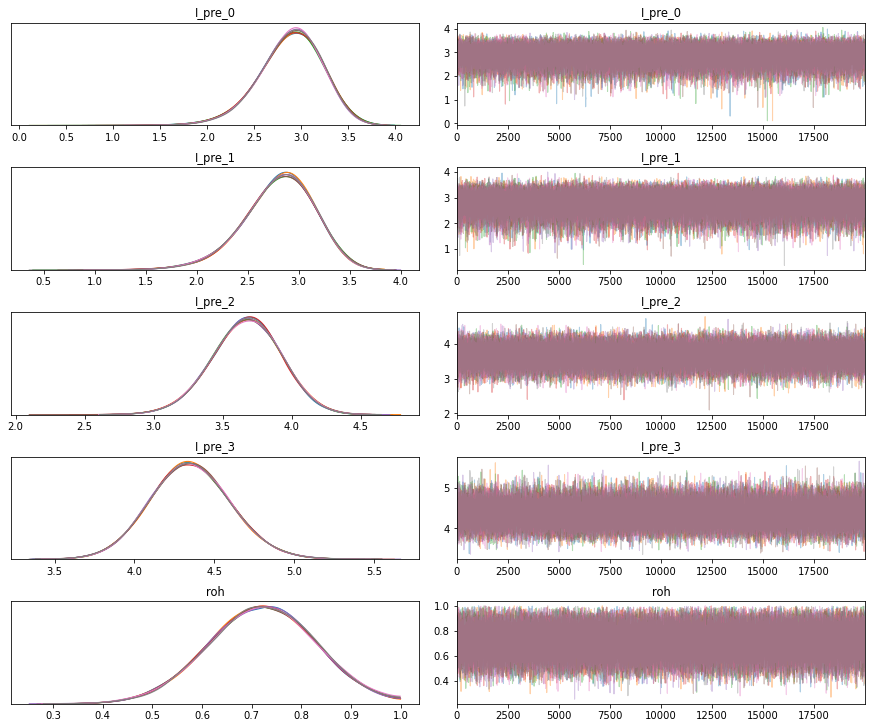

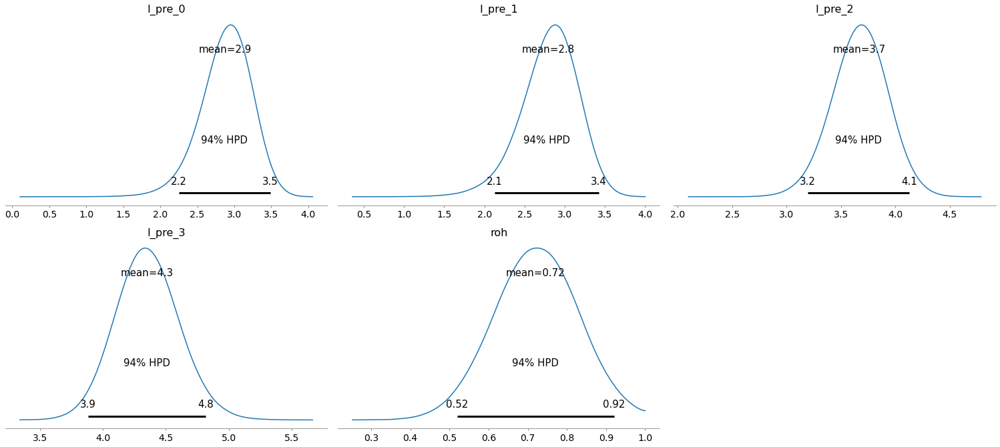

In [108]:
import arviz as az

with amplifier_model:
    print(az.summary(trace, round_to=2))
    pm.traceplot(trace)
    az.plot_posterior(trace)

## 4. ABC: Approximate Bayesian Computation - eine bessere? Lösung

Die ABC-Familie unterscheidet sich von den klassichen bayesschen Methoden daran, dass sich der Algorithmus im Annahme-/Ablehnung-Schritt grob gesagt nicht um die Wahrscheinlichkeit jeder Beobachtung kümmert. Vielmehr schaut er nach ein paar charakterisierenden Statistiken sämtlicher Beobachtungen, um dann zu beurteilen, ob der Parameterwertvorschlag zulässig ist. Diese Methode hat wie der Name schon sagt einen selbstverständlichen Vorteil, dass die Rechenaufwand wesentlich niedriger ist, aber zudem noch einen Anderen. Wenn die Beobachtungen viel Zufall beinhalten, was besonders oft vorkommen kann, wenn es sich um eine kleine Stichprobe handelt sowie in unserem Fall (man denke an dem großen Rauschen $\mathcal{N}(0, 3)$ in der letzten Formel, das schon allein zu fast der ganzen Schwankung im Endergebnis beigetragen hat), dann ist der genaue Wert jeder Beobachtung allein eher von kleiner Bedeutung. Die charakterisierenden Statistiken hingegen, können genauere und robustere Informationen liefern. In dem Falle droht dem klassischen MCMC-Verfahren, weil es von jeder Beobachtung als geschätzter Information für das Modelltraining mehrfach Gebrauch macht, das Overfitting.  

Ich zeige hier mit 1000 erzeugten Stichproben wo $I_{set} = 5$, $\rho = 0,7$, mit jeweils 25 Beobachtungen das Problem, dass 25 in unserem Fall eine kleinere Anzahl für die Stichprobe ist und die genaueren Werte der Beobachtungen viel Zufall beinhalten können.  

In [111]:
list_sample_mean = list()
list_sample_std = list()
total_steps = 10000

for step in range(total_steps):
    sam = gen_data_fixed_mu(0.7, 4, 25)
    list_sample_mean.append(sam.mean())
    list_sample_std.append(sam.std())
    if step % (total_steps / 5) == 0:
        print("loop: ", i)
    elif step == total_steps - 1:
        print("Finished.")

loop:  0
loop:  200
loop:  400
loop:  600
loop:  800
Finished.


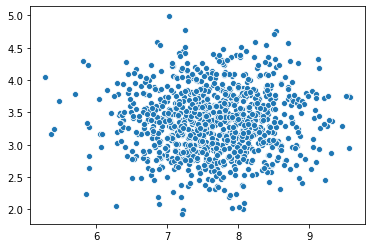

In [112]:
sns.scatterplot(list_sample_mean, list_sample_std)

Wir können sehen, selbst die Durchschnittwerte und die Abweichungen der 1000 erzeugten Stichproben mit dem selben $\rho$ (0,7 ist sogar der vorhergesagte Wert von $\rho$) verteilen sich zufällig, geschweige denn ihre jeweiligen 25 Beobachtungen selbst. Es ist also dem Autor nach fragwürdig, derartige Beobachtungen als vertrauenswürdige Informationen im Modelltraining einzel zu benutzen.   
  
Ich gehe hier davon aus, die Methodenfamilie ABC wäre vielleicht eine bessere Wahl, in dem man die richtige(n) Statistik(en) der Stichproben auswählt. Aber welche Statistik(en) nehmen wir? Ein möglicher Kandidat sind die empirischen Quantile (man könnte beispielsweise .05, .5, .95 nehmen). Hier überlege ich mir die Durchschnittwerte und die Abweichungen als wichtige Statistiken zu benutzen. Drüber hinaus ist noch zu beachten, in 3 der 4 Originalstichproben ist die empirischhe Abweichung kleiner 3, d. h. die empirische Abweichung bietet hier überhaupt keine nützliche Information, weil das unabhängige Rauschen in der letzten Formel selbst eine Abweichung von 3 hat. Aus diesem Grund lasse ich hier auch die Abweichung weg in der Wahl von den zum Training dienenden Statistiken und behalte schlussendlich nur den Durchschnitt.  

Ich mache hier keine strikte statistische Herleitung weil sie ein wenig vom Thema abweicht, sondern sage ich einfach durch optische Beobachtung des Graphes von hier oben, dass der Durchschnittwert einer erzeugten 25-Stichprobe zu einem bestimmten $I_{set}$-Wert dann zulässig ist, wenn dieser nicht weiter als 1,5 vom empirischen Durchschnittwert der 25(bzw. 24)-Originalstichprobe zum selben $I_{set}$-Wert entfernt ist. Ferner um die Situationen für die 4 verschiedenen $I_{set}$-Werte zusammenzufassen, benutze ich anstatt eine Alpha-Kumilierung (die Bonferroni-Korrektur z. B.), was in der Multitest-Szene häufig vorkommt, eine Abstandfunktion. Das heißt ein $\rho$-Wertvorschlag ist genau dann zulässig, wenn die quadratische Summe aller 4 Durchschnittwert-Entfernungen nicht ($1,5² * 4 =$) 9 überschreitet. So wird jeder Entfernung ein bisschen Spielraum gelassen, falls sie größer als 1,5 ist, in dem die gesamte Summe durch andere kleinere Entfernungen ausgeglichen werden darf. Selbe Idee wie in der Multitest-Korrektur. Diesen Grenzwert von 9 kann man in Zukunft natürlich durch striktere statistische Herleitung verbessern.

In [122]:
def calculate_distance(roh, sample_size = 1000):
    sum_square = 0
    for i_set, i_obs_compenent in [(4, I_obs_4), (4.5, I_obs_4_5), (5, I_obs_5), (5.6, I_obs_5_6)]:
        gen_da = gen_data_fixed_mu(roh, i_set, sample_size)
        sum_square += np.square(gen_da.mean() - i_obs_compenent.mean())
    return sum_square

threshold = 1.5 * 1.5 * 4
rho_list_abc = list()
total_steps = 100000

for step in range(total_steps):
    rho = np.random.uniform()
    dist_square_sum = calculate_distance(rho)
    if dist_square_sum < threshold:
        rho_list_abc.append(rho)
    if step % (total_steps / 5) == 0:
        print("loop: ", step)
    elif step == total_steps - 1:
        print("Finished.")

loop:  0
loop:  20000
loop:  40000
loop:  60000
loop:  80000
Finished.


Sample length: 28524, mean: 0.71, standard deviation: 0.08


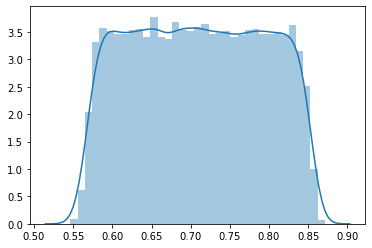

In [123]:
print("Sample length: {0:d}, mean: {1:.2f}, standard deviation: {2:.2f}".format(len(rho_list_abc), np.array(rho_list_abc).mean(), np.array(rho_list_abc).std()))
sns.distplot(rho_list_abc)

## 5. Zusammenfassung
In diesem Notebook sind wir bei der Suche nach möglichen Werten der Effizienz $\rho$ in einem stochastischen Problem der Zufallsvariablenfolge 3 Implementierungen der bayesschen Methoden durchgegangen.   

| Implementierung | geschätzter Durchschnitt von $\rho$ | geschätzte Abweichung von $\rho$ | Rechenaufwand |
| :-: | -: | -: | :-: |
| Bayessche Inferenz mit MCMC, selbst implementiert | 0,69 | 0,04 | groß |
| Bayessche Inferenz mit MCMC, implementiert durch `PyMC3` | 0,72 | 0,11 | mittel |
| Approximate Bayesian Computation, selbst implementiert | 0,71 | 0,08 | klein |

Die drei Implementierungen liefern sehr ähnliche Durchschnittwerte, jedoch unterschiedliche Ungenauigkeiten. Dass die erste Methode von Hastings eine kleinere Abweichung ergeben hat, mag daran liegen, dass Hastings dadurch Konvergenzgeschwindigkeit gewinnen möchte, in dem der Algorithmus den nächsten Parameterwert immer nur in der Nähe vom Letzten vorschlägt. Dies führt dazu, dass nicht gleich häufig im ganzen Parameterraum gesucht wird und somit eine systematische Abweichung in der Vermutung entstehen könnte (ich hätte hier auch einfaches Metropolis anstatt Hastings implementieren können um der Problematik auszuweichen, aber ich bräuchte dafür einen performanteren Rechner...). Das ist halt der Preis, dass die Hastings-Methode zahlen muss. Ich halte ferner das Ergebnis das ABC ergeben hat für vertrauenswürdiger, denn wie oben begründet wurde ist in den 99 OriginalBeobachtungen nach der Entfernung des Ausreißers sehr viel Zufall drin. Dieser große Zufall kann bei mehrfacher raffinierter Nutzung jeder einzelnen Beobachtung im MCMC-Verfahren leicht ein Overfitting einführen. Die ABC-Methode, die hier nur die Mittelpunkte der Originalbeobachtungen verwendet hat, hat die robusteren beschreibenden Informationen, die in den Beobachtungen enthalten sind, nämlich den Mittelwert, genau insofern benutzt, wie es sein sollte.  
  
Im Großen und Ganzen kann man die Schlussfolgerung ziehen, dass die Vermutung von $\rho$ bei 0,70 liegt mit einer vermutlichen Abweichung von 0,10.